In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [2]:
#Lectura del df_useritemsgames.parquet

df = pd.read_parquet('df_useritemsgames.parquet')

In [3]:
#Resumen de estadisticas descriptivas

summary = df.describe()
print(summary)


            item_id  sentiment_analysis   items_count      steam_id  \
count  6.081633e+06        6.081633e+06  6.081633e+06  6.081633e+06   
mean   1.829086e+05        1.344449e+00  5.499719e+02  7.656120e+16   
std    1.331039e+05        8.268082e-01  1.162874e+03  3.905116e+07   
min    1.000000e+01        0.000000e+00  0.000000e+00  7.656120e+16   
25%    3.323000e+04        1.000000e+00  1.120000e+02  7.656120e+16   
50%    2.196400e+05        2.000000e+00  2.060000e+02  7.656120e+16   
75%    2.733500e+05        2.000000e+00  4.150000e+02  7.656120e+16   
max    5.273400e+05        2.000000e+00  7.762000e+03  7.656120e+16   

       playtime_forever  playtime_2weeks         price            id  \
count      6.081633e+06     6.081633e+06  6.081633e+06  6.081633e+06   
mean       1.404877e+03     3.003319e+01  1.272774e+01  1.837619e+05   
std        7.555785e+03     2.712773e+02  1.420012e+01  1.335693e+05   
min        0.000000e+00     0.000000e+00  0.000000e+00  1.000000e+01   


In [8]:
# Verifica si el directorio 'plots/eda' existe, y si no, lo crea
output_dir = 'plots/eda'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Genera visualizaciones automáticamente para cada columna numérica
for col in df.select_dtypes(include=['float64', 'int64']).columns:
    plt.figure()
    sns.distplot(df[col])
    plt.savefig(os.path.join(output_dir, col + '_histplot.png'))
    plt.close()

C:\Users\Esteban Ramos\AppData\Local\Temp\ipykernel_10872\3990762658.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[col])
C:\Users\Esteban Ramos\AppData\Local\Temp\ipykernel_10872\3990762658.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[col])
C:\Users\Esteban Ramos\AppData\Local

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

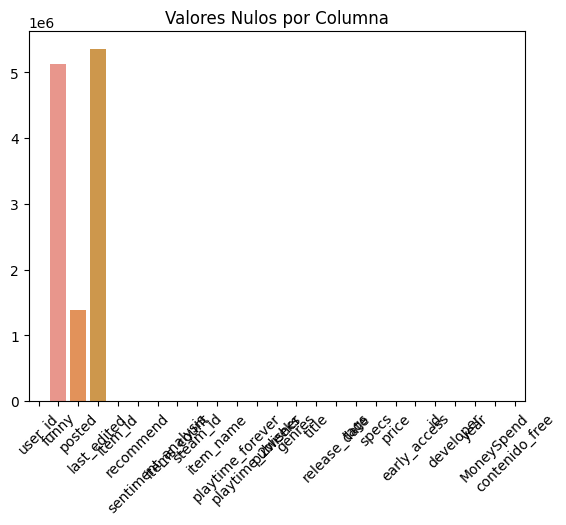

In [4]:
# Verificar si hay valores nulos en el DataFrame
null_counts = df.isnull().sum()

# Visualizar los valores nulos en un gráfico de barras
sns.barplot(x=null_counts.index, y=null_counts.values)
plt.title('Valores Nulos por Columna')
plt.xticks(rotation=45)
plt.tight_layout

In [10]:
# Obtener estadísticas resumidas para columnas categóricas
for column in df.select_dtypes(exclude=['number']).columns:
    summary = df[column].value_counts()
    print(f'Estadísticas para {column}:\n{summary}\n')

Estadísticas para user_id:
user_id
phrostb              69858
chidvd               51280
76561198070585472    31192
Outbackalien         28926
76561198044023118    24804
                     ...  
raquja                   1
76561198134648837        1
76561198091548646        1
76561198093250521        1
woahlevel20              1
Name: count, Length: 19900, dtype: int64

Estadísticas para funny:
funny
1 person found this review funny      592544
2 people found this review funny      148122
3 people found this review funny       77187
4 people found this review funny       35792
6 people found this review funny       17751
                                       ...  
171 people found this review funny         3
58 people found this review funny          3
198 people found this review funny         1
50 people found this review funny          1
759 people found this review funny         1
Name: count, Length: 115, dtype: int64

Estadísticas para posted:
posted
2015-11-15    63184
2015-12

c:\Users\Esteban Ramos\Desktop\MLOps - STEAM\venv\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


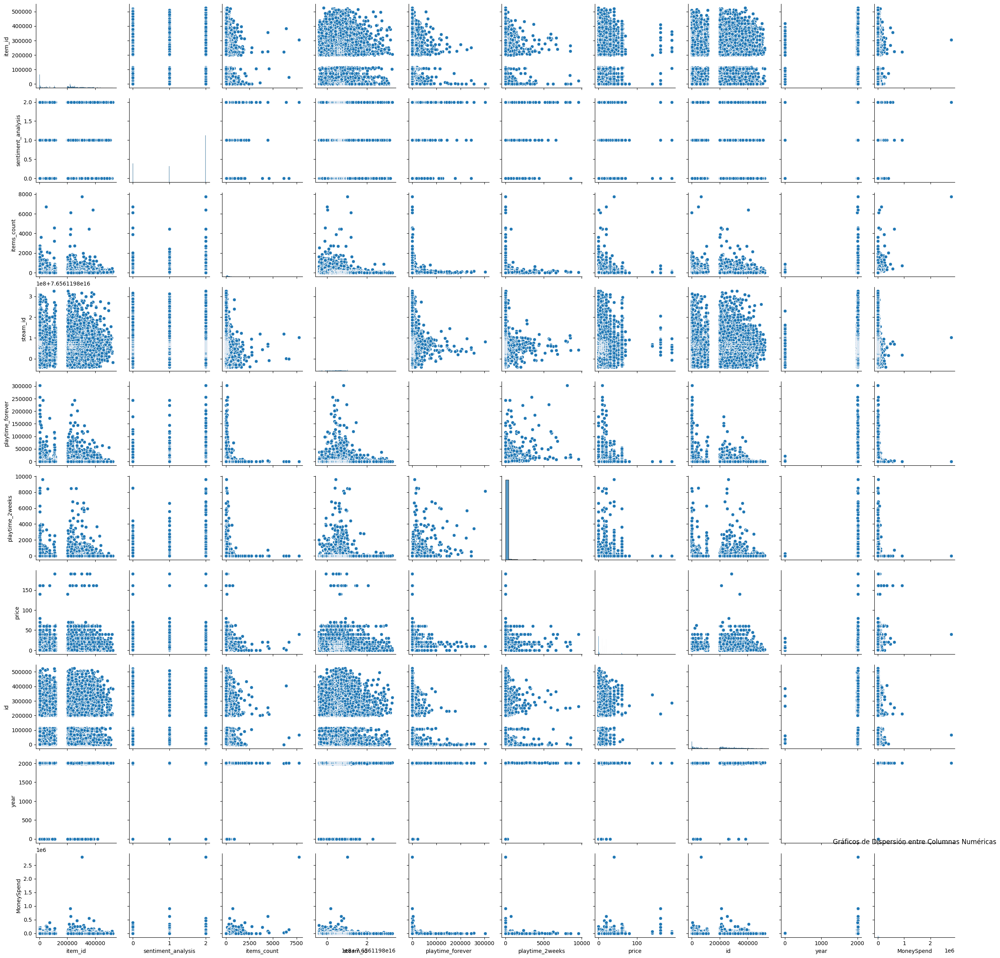

In [11]:
# Crear gráficos de dispersión para todas las combinaciones de columnas numéricas
sns.pairplot(df.select_dtypes(include=['number']))
plt.title('Gráficos de Dispersión entre Columnas Numéricas')
plt.show()

Text(0.5, 1.0, 'Juegos lanzados por año')

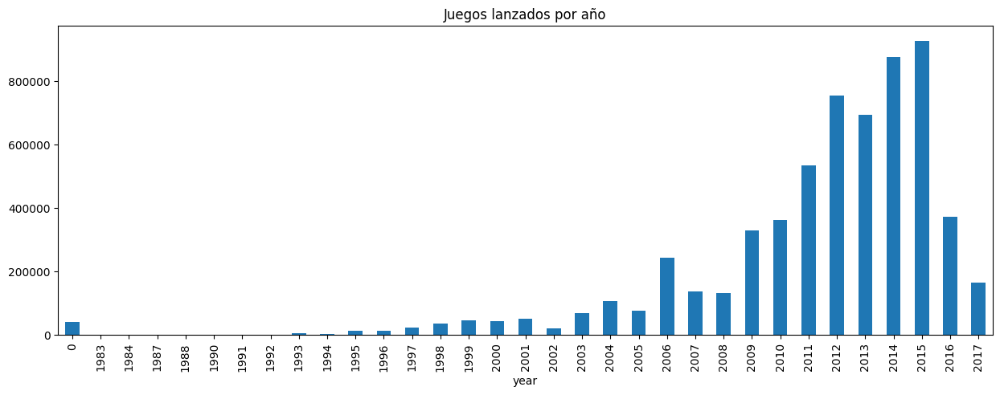

In [14]:
#Crear un grafico mostrando el año en que mas juegos se han lanzado

df['year'] = df['year'].astype(int)
df['year'].value_counts().sort_index().plot(kind='bar', figsize=(15, 5))
plt.title('Juegos lanzados por año')

Text(0.5, 1.0, 'Distribucion de los precios')

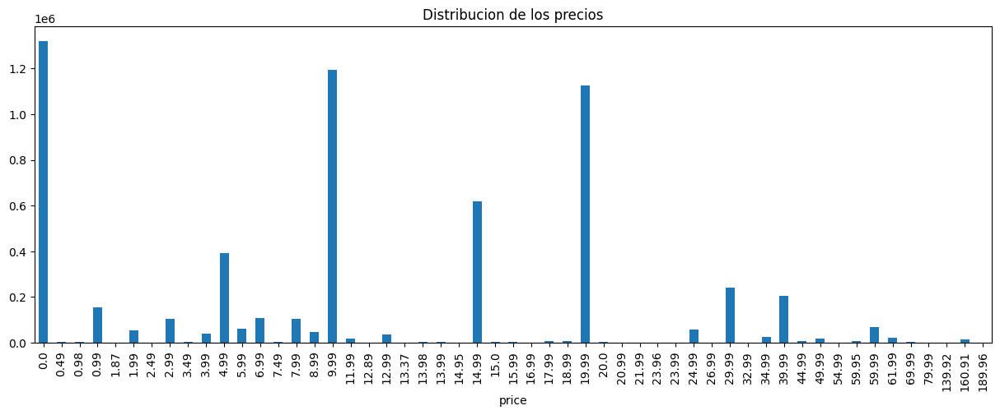

In [15]:
#Crear un grafico de la columna price mostrando la distribucion de los precios

df['price'].value_counts().sort_index().plot(kind='bar', figsize=(15, 5))
plt.title('Distribucion de los precios')

Text(0.5, 1.0, 'Media de sentiment_analysis por año')

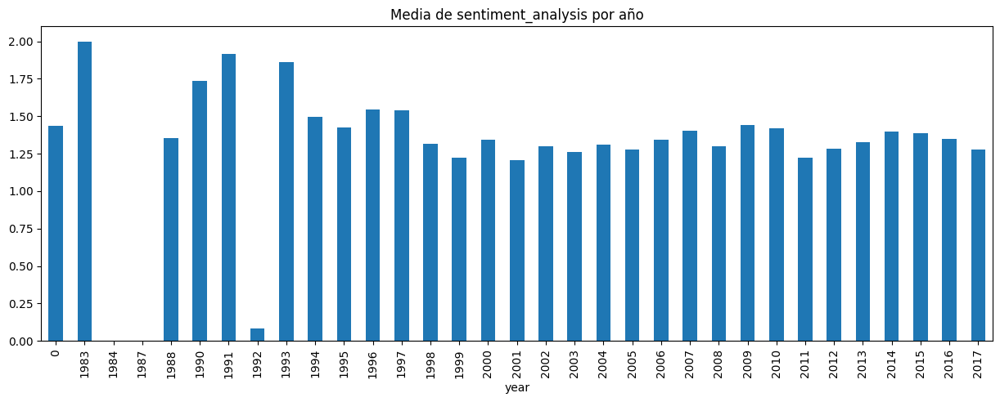

In [18]:
#Crear un grafico de la media de sentiment_analysis por year

df.groupby('year')['sentiment_analysis'].mean().plot(kind='bar', figsize=(15, 5))
plt.title('Media de sentiment_analysis por año')


Text(0.5, 1.0, 'Media de la sumatoria de price por año')

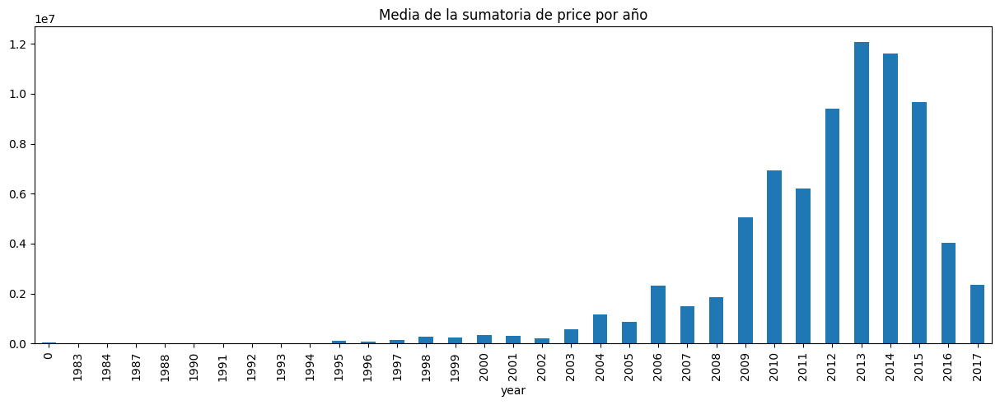

In [19]:
#Crear un grafico de la media de la sumatoria de price por year

df.groupby('year')['price'].sum().plot(kind='bar', figsize=(15, 5))
plt.title('Media de la sumatoria de price por año')

                                title   price
4408040  ACE - Arena: Cyber Evolution  189.96
3024648    RaceRoom Racing Experience  160.91
5402351       HIS (Heroes In the Sky)  139.92
6079891             AGFPPROV3 Premium   79.99
5655321              RPG Maker VX Ace   69.99


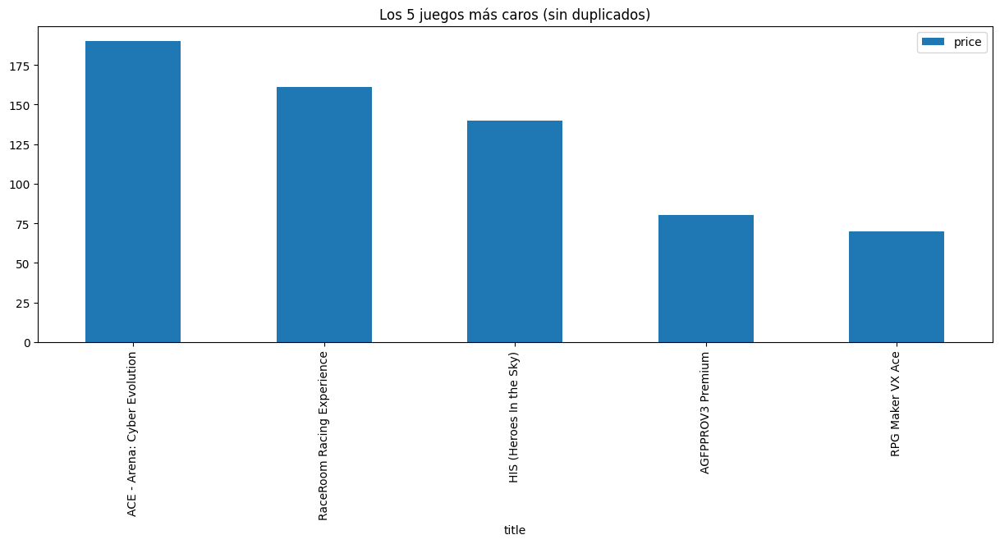

In [28]:
# Filtrar filas duplicadas por título y luego crear un gráfico de los 5 juegos más caros
unique_games_df = df.drop_duplicates(subset='title', keep='first')
top_5_expensive_games = unique_games_df.sort_values(by='price', ascending=False).head(5)

top_5_expensive_games.plot(kind='bar', x='title', y='price', figsize=(15, 5))
plt.title('Los 5 juegos más caros (sin duplicados)')

# Imprimir el nombre de los juegos más caros y sus costos
print(top_5_expensive_games[['title', 'price']])


Los 5 géneros más populares son:
genres
['Action']                 1120425
['Action', 'Adventure']     332649
['Strategy']                331555
['Action', 'Indie']         285683
['Action', 'RPG']           185007
Name: count, dtype: int64


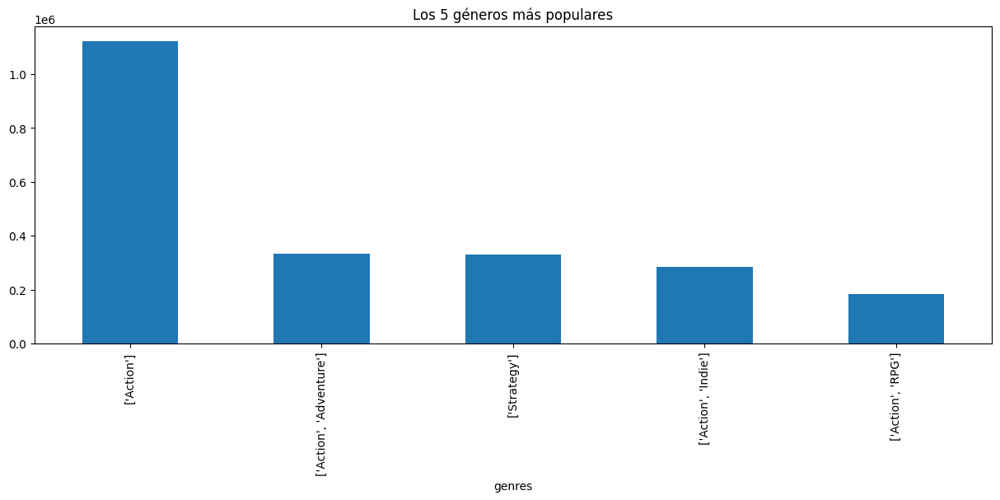

In [30]:
#Creamos un grafico de los 5 generos mas populares

top_5_genres = df['genres'].value_counts().head(5)
top_5_genres.plot(kind='bar', figsize=(15, 5))
plt.title('Los 5 géneros más populares')

#Imprimimos los 5 generos mas populares

print(f"Los 5 géneros más populares son:\n{top_5_genres}")

Los 5 géneros menos populares son:
genres
['Action', 'Adventure', 'Casual', 'Indie', 'Simulation']                       1
['Action', 'Indie', 'RPG', 'Simulation', 'Strategy']                           1
['Action', 'Adventure', 'Casual', 'Indie', 'RPG', 'Simulation', 'Strategy']    1
['Adventure', 'Free to Play', 'Simulation']                                    1
['Action', 'Casual', 'Indie', 'Racing', 'Simulation']                          1
Name: count, dtype: int64


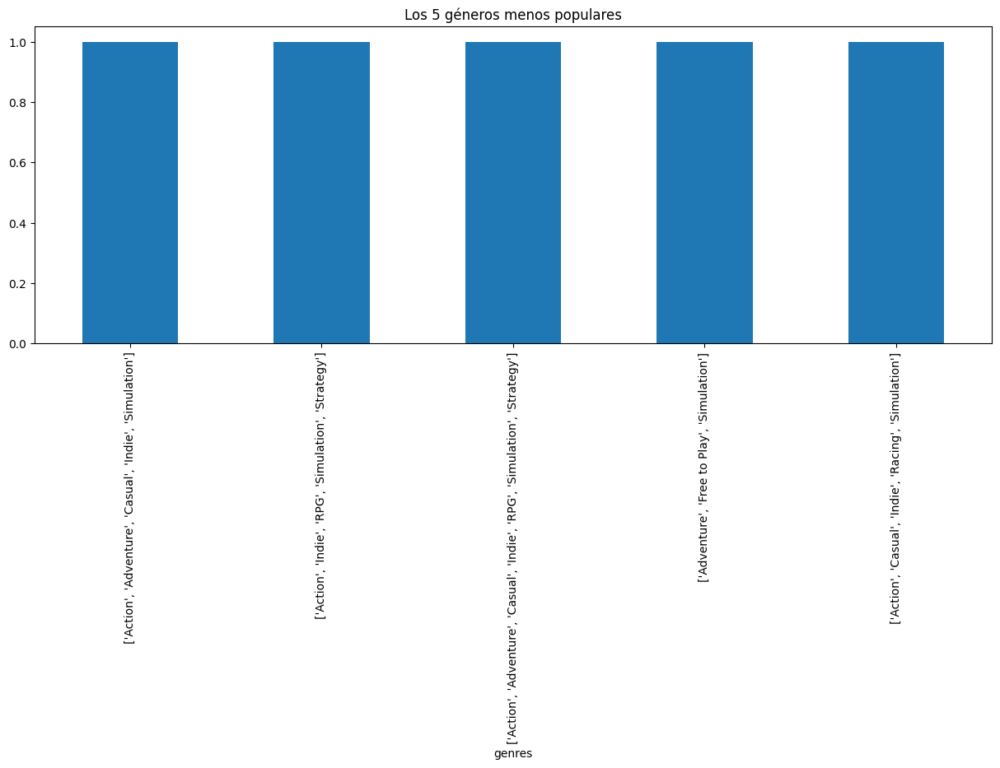

In [42]:
#Creamos un grafico de los 5 generos menos populares

top_5_genres = df['genres'].value_counts().tail(5)
top_5_genres.plot(kind='bar', figsize=(15, 5))
plt.title('Los 5 géneros menos populares')

#Imprimimos los 5 generos menos populares
print(f"Los 5 géneros menos populares son:\n{top_5_genres}")

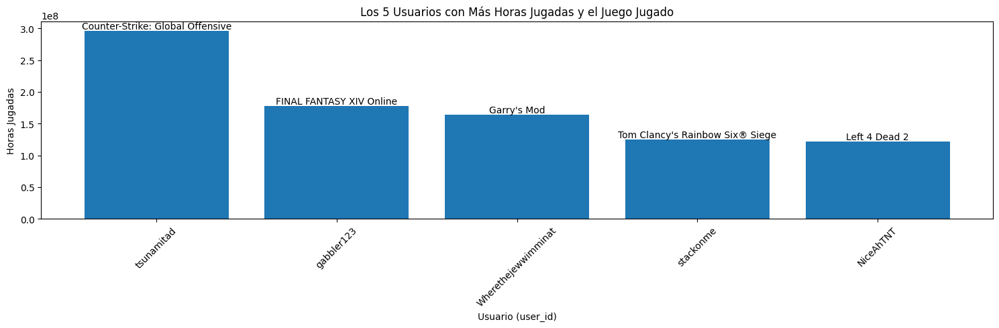

In [35]:
#Creamos un grafico con los 5 usuarios con mas horas jugadas y el nombre del juego que jugaron (user_id, playtime_forever y title)

user_game_hours = df.groupby(['user_id', 'title'])['playtime_forever'].sum().reset_index()

top_5_users = user_game_hours.sort_values(by='playtime_forever', ascending=False).head(5)

plt.figure(figsize=(15, 5))
plt.bar(top_5_users['user_id'], top_5_users['playtime_forever'])
plt.xlabel('Usuario (user_id)')
plt.ylabel('Horas Jugadas')
plt.title('Los 5 Usuarios con Más Horas Jugadas y el Juego Jugado')
plt.xticks(rotation=45)

for index, row in top_5_users.iterrows():
    plt.text(row['user_id'], row['playtime_forever'], row['title'], ha='center', va='bottom')

plt.tight_layout()
plt.show()


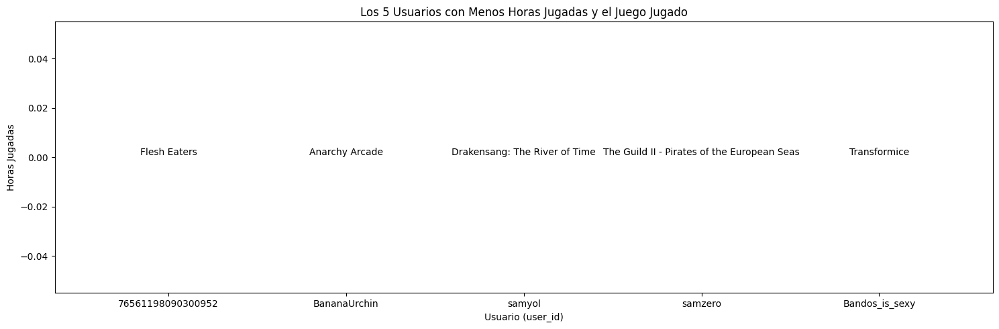

In [41]:
#Creamos un grafico mostrando los juegos menos jugados (playtime_forever) y el nombre del juego que jugaron (user_id, playtime_forever y title)

user_game_hours = df.groupby(['user_id', 'title', 'genres'])['playtime_forever'].sum().reset_index()

top_5_users = user_game_hours.sort_values(by='playtime_forever', ascending=True).head(5)

plt.figure(figsize=(15, 5))
plt.bar(top_5_users['user_id'], top_5_users['playtime_forever'])
plt.xlabel('Usuario (user_id)')
plt.ylabel('Horas Jugadas')
plt.title('Los 5 Usuarios con Menos Horas Jugadas y el Juego Jugado')

for index, row in top_5_users.iterrows():
    plt.text(row['user_id'], row['playtime_forever'], row['title'], ha='center', va='bottom')

plt.tight_layout()



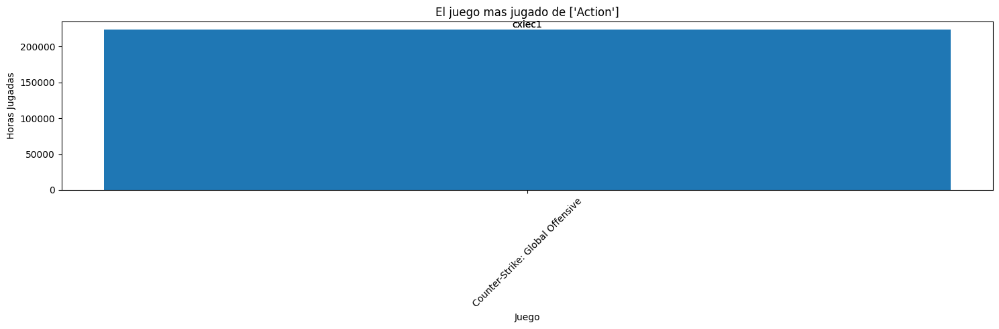

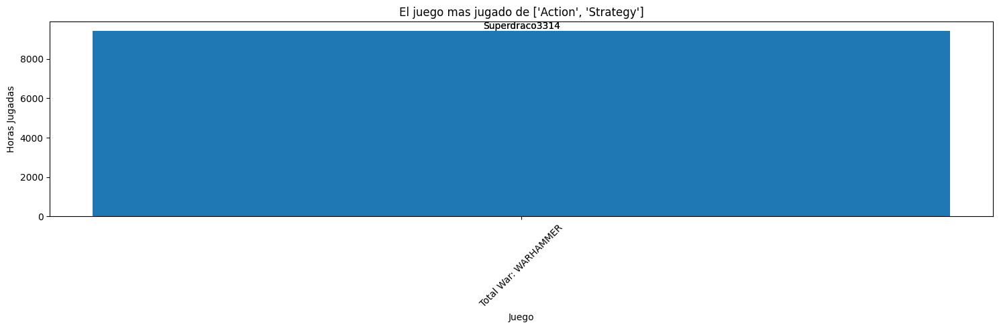

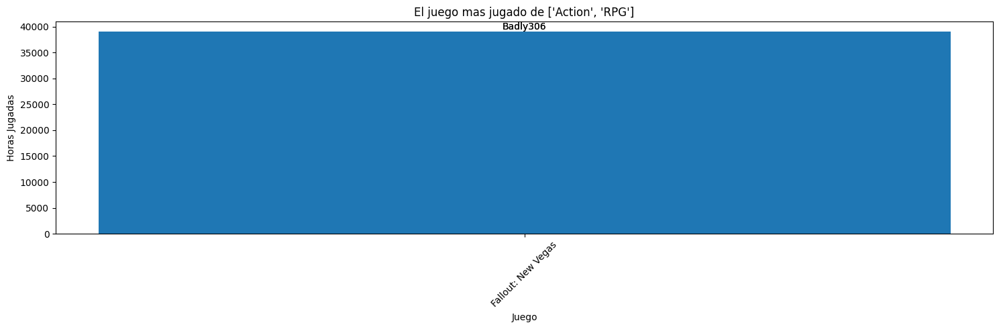

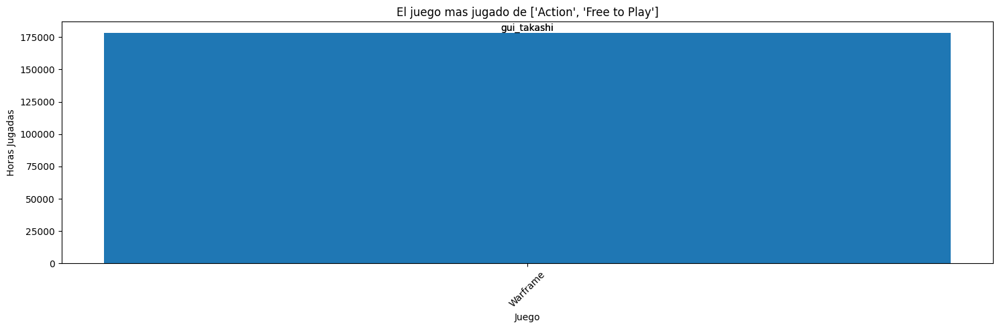

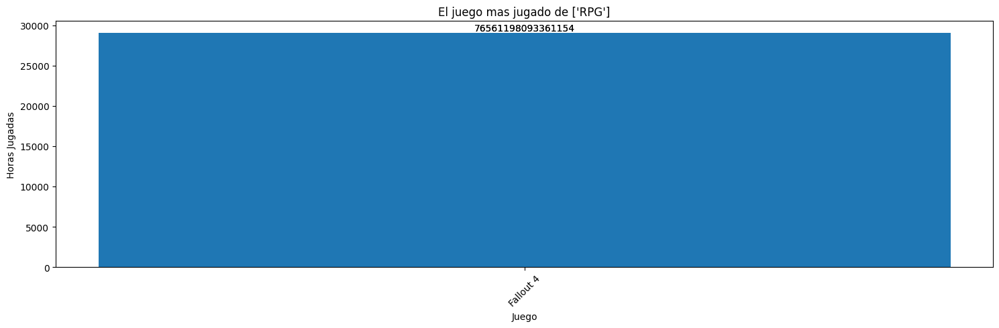

...

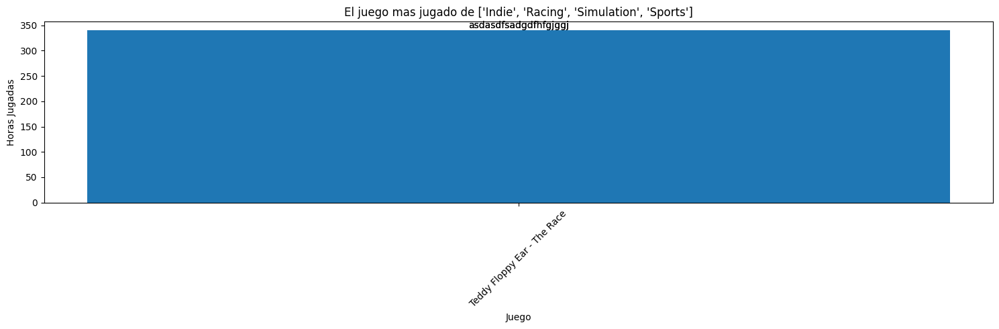

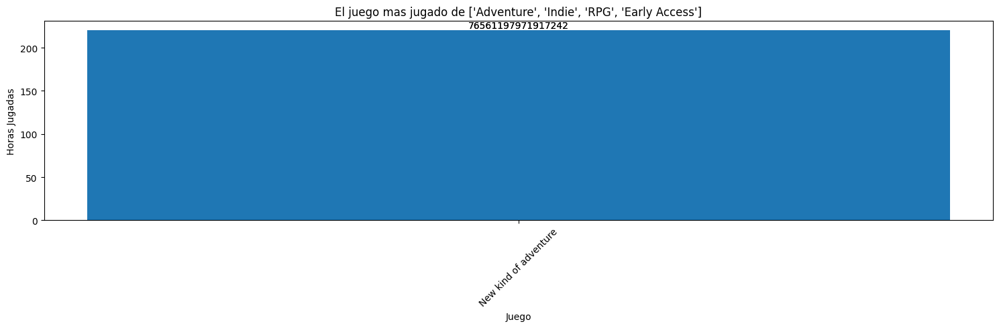

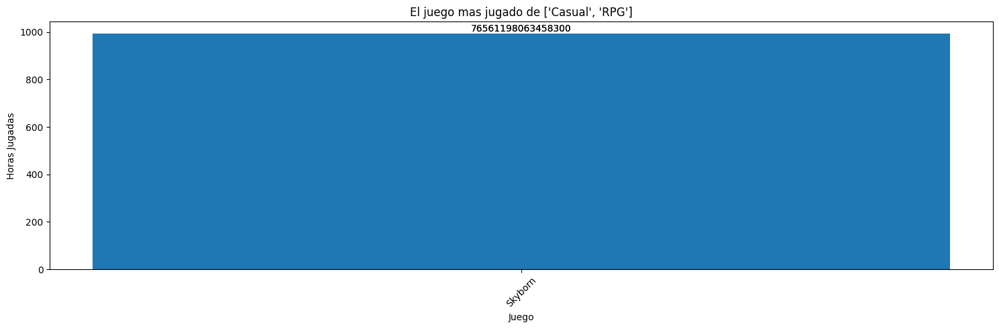

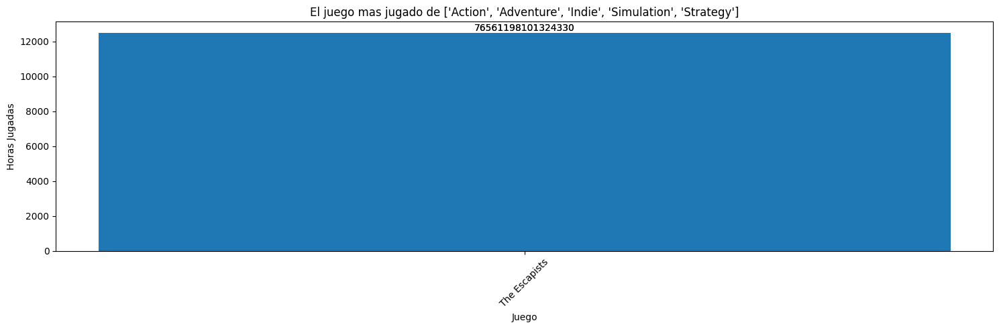

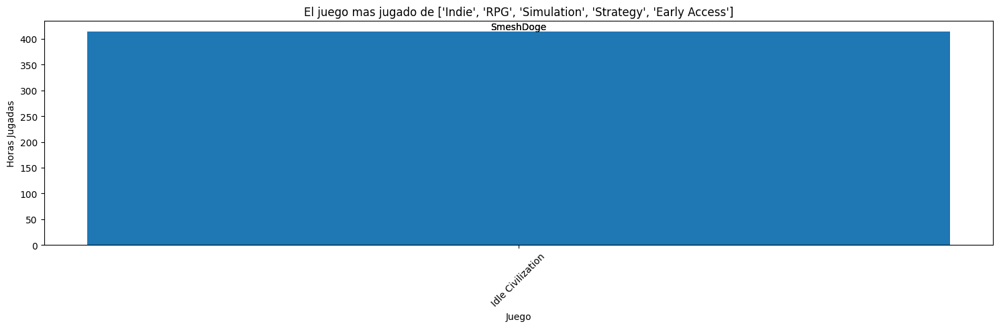

C:\Users\Esteban Ramos\AppData\Local\Temp\ipykernel_10872\880069823.py:18: UserWarning: Glyph 65286 (\N{FULLWIDTH AMPERSAND}) missing from current font.
  plt.tight_layout()


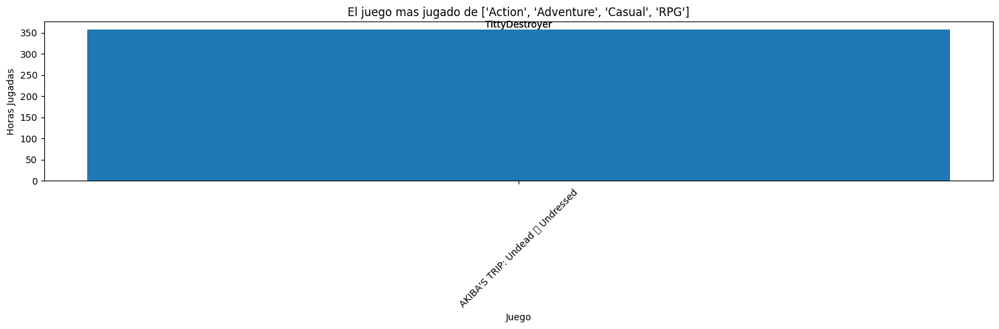

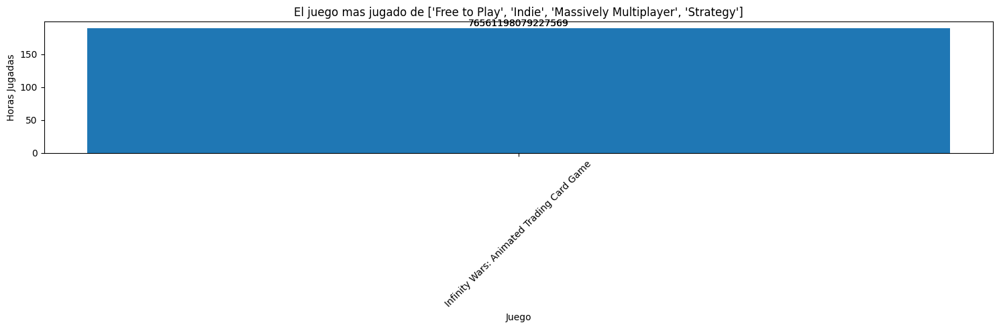

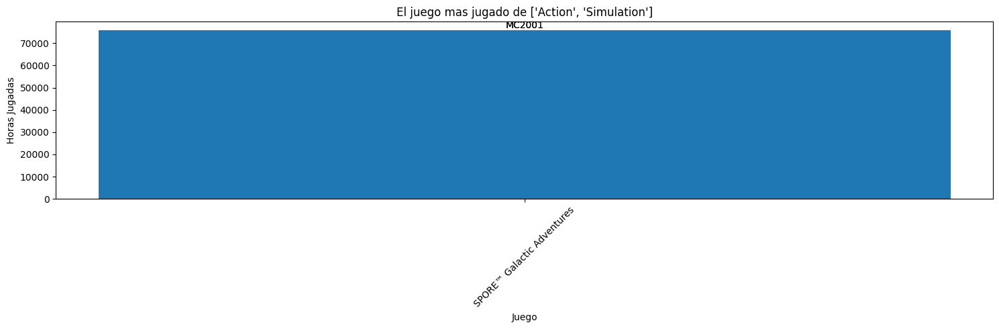

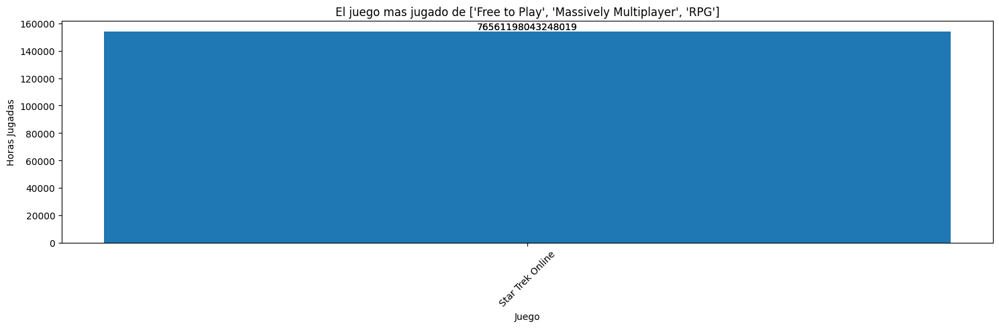

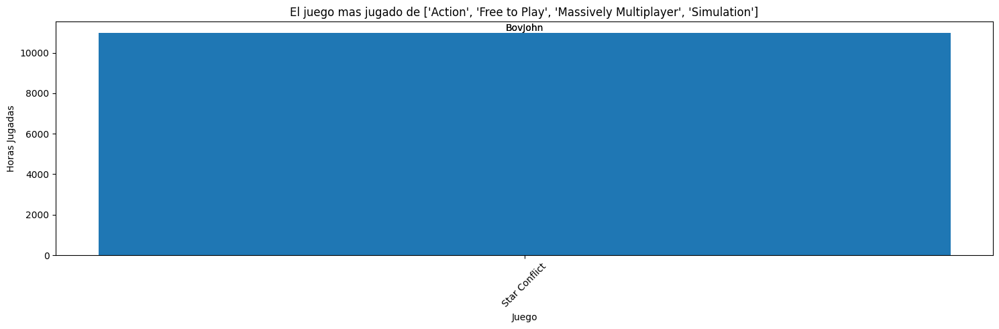

...

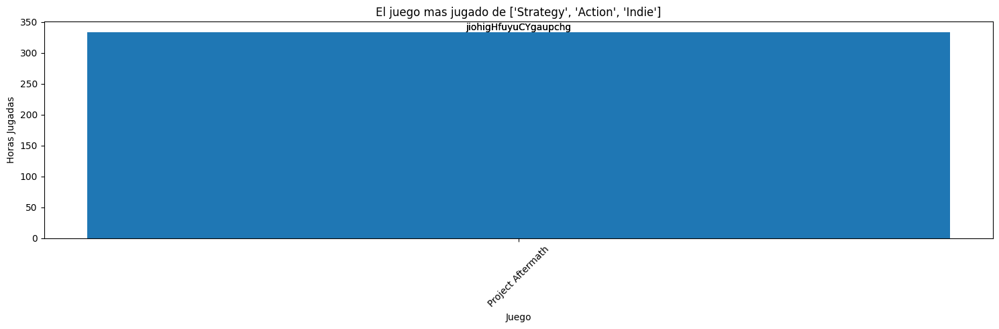

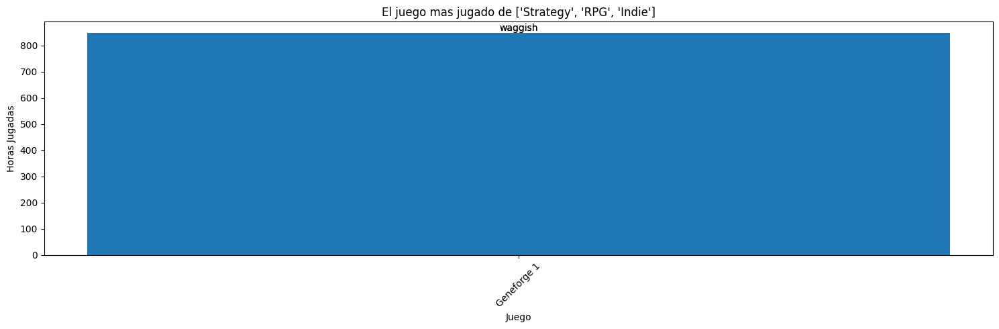

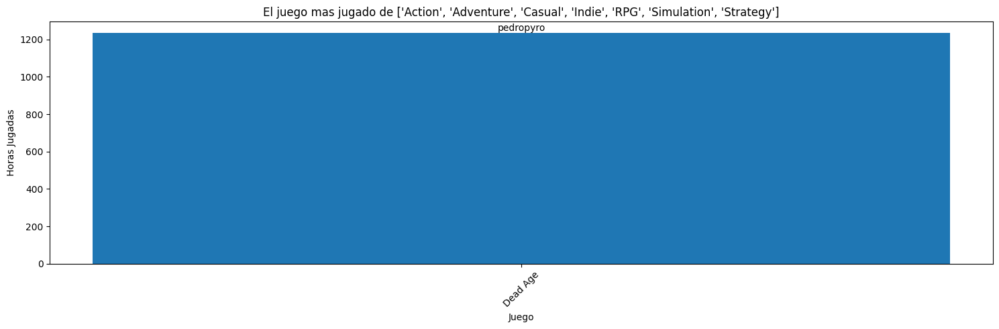

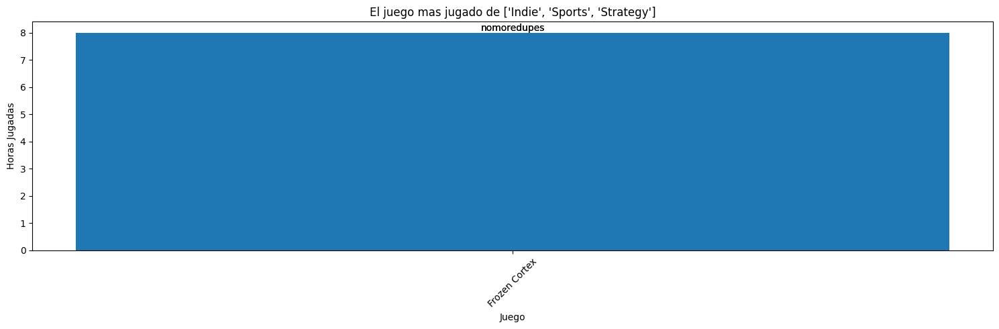

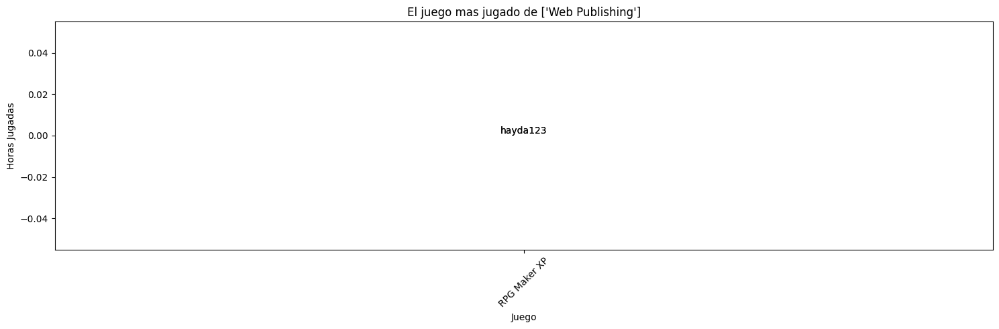

In [44]:
#Visualizamos los 2 juegos mas populares por genero

all_genres = df['genres'].unique()

for genre in all_genres:
    genre_df = df[df['genres'] == genre]
    top_2_games = genre_df.sort_values(by='playtime_forever', ascending=False).head(2)
    plt.figure(figsize=(15, 5))
    plt.bar(top_2_games['title'], top_2_games['playtime_forever'])
    plt.xlabel('Juego')
    plt.ylabel('Horas Jugadas')
    plt.title(f'El juego mas jugado de {genre}')
    plt.xticks(rotation=45)

    for index, row in top_2_games.iterrows():
        plt.text(row['title'], row['playtime_forever'], row['user_id'], ha='center', va='bottom')

    plt.tight_layout()
    plt.show()